## Part 1 加载展示图片

In [ ]:
# 加载图片

import os
import glob
import random
from pathlib import Path

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# ----------------------------
# 1) Set your test image folder
# ----------------------------
# Example:
IMG_DIR = Path("/home/path_sam3/pipeline/datasets/Glas_new/test/images")
#IMG_DIR = Path(os.environ.get("IMG_DIR", "./test/images")).expanduser().resolve()

# Extensions to search
EXTS = ["*.bmp", "*.png", "*.jpg", "*.jpeg", "*.tif", "*.tiff"]

def list_images(img_dir: Path, exts=EXTS):
    files = []
    for e in exts:
        files += sorted(img_dir.glob(e))
    return files

images = list_images(IMG_DIR)
print(f"IMG_DIR = {IMG_DIR}")
print(f"Found {len(images)} images.")
images[:10]


IMG_DIR = /home/path_sam3/pipeline/datasets/Glas_new/test/images
Found 20 images.


[PosixPath('/home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_1.bmp'),
 PosixPath('/home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_10.bmp'),
 PosixPath('/home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_11.bmp'),
 PosixPath('/home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_12.bmp'),
 PosixPath('/home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_13.bmp'),
 PosixPath('/home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_14.bmp'),
 PosixPath('/home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_15.bmp'),
 PosixPath('/home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_16.bmp'),
 PosixPath('/home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_17.bmp'),
 PosixPath('/home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_18.bmp')]

Path: /home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_17.bmp
Size (W,H): (775, 522)


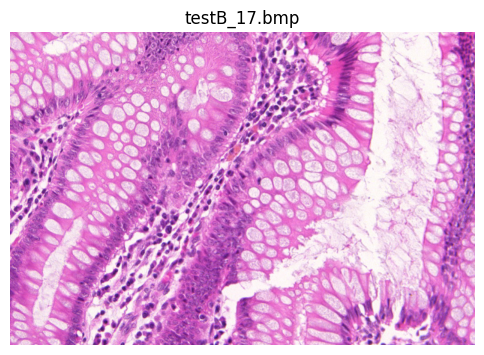

In [ ]:
# ----------------------------
# 2) 显示随机图片
# ----------------------------
assert len(images) > 0, "No images found. Check IMG_DIR."

p = random.choice(images)
img = Image.open(p).convert("RGB")

print("Path:", p)
print("Size (W,H):", img.size)

plt.figure(figsize=(6,6))
plt.imshow(img)
plt.axis("off")
plt.title(p.name)
plt.show()

[4/19] /home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_13.bmp
Size (W,H): (775, 522)


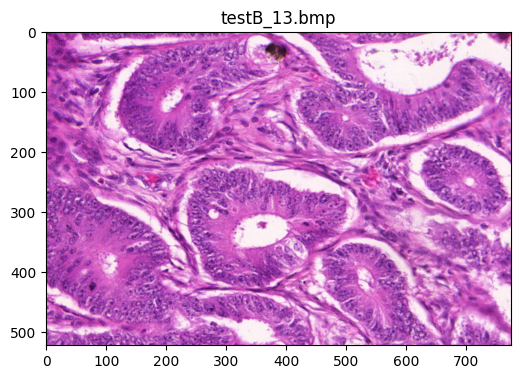

In [ ]:
# ----------------------------
# 3) 按序号展示图片
# ----------------------------
# Change idx and re-run.
idx = 4  # <-- change me
idx = max(0, min(idx, len(images)-1))

p = images[idx]
img = Image.open(p).convert("RGB")

print(f"[{idx}/{len(images)-1}] {p}")
print("Size (W,H):", img.size)

plt.figure(figsize=(6,6))
plt.imshow(img)
plt.axis("on")
plt.title(p.name)
plt.show()

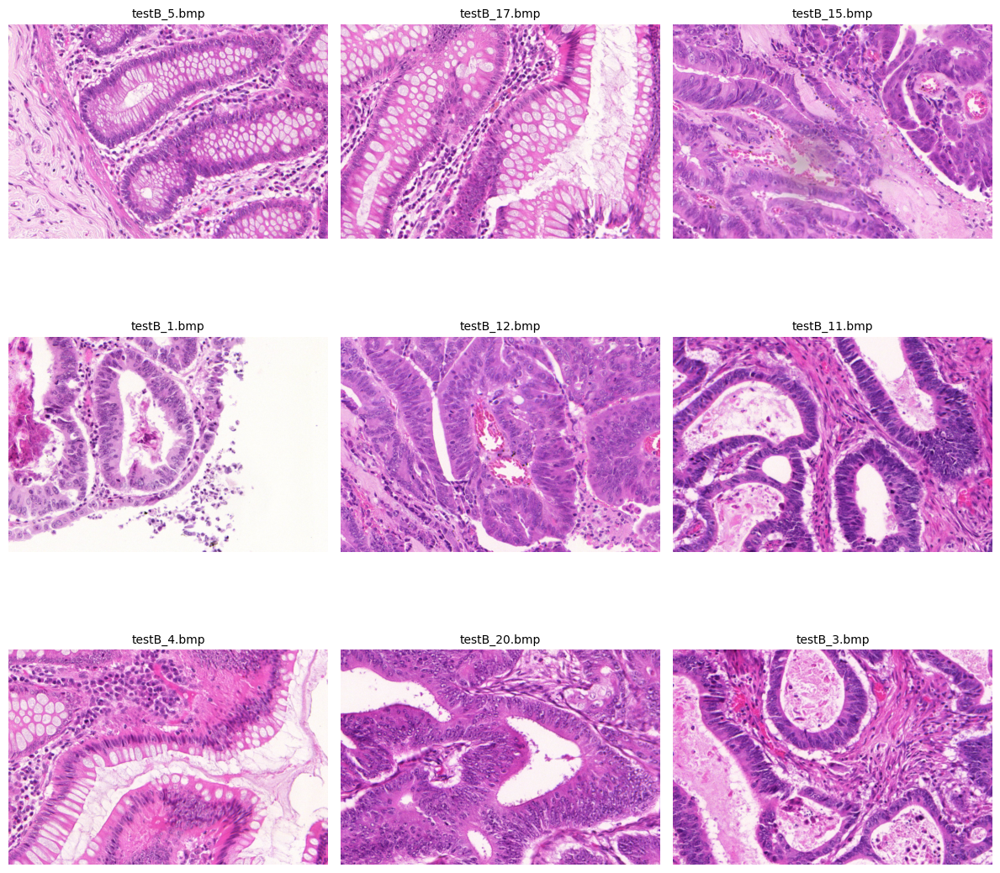

In [ ]:
# ----------------------------
# 4) 多张图片
# ----------------------------
k = 9  # number of images to show
k = min(k, len(images))
sel = random.sample(images, k)

cols = int(np.ceil(np.sqrt(k)))
rows = int(np.ceil(k / cols))

plt.figure(figsize=(4*cols, 4*rows))
for i, p in enumerate(sel, 1):
    img = Image.open(p).convert("RGB")
    ax = plt.subplot(rows, cols, i)
    ax.imshow(img)
    ax.set_title(p.name, fontsize=10)
    ax.axis("off")
plt.tight_layout()
plt.show()


In [5]:
# ----------------------------
# 5) 检查图片格式
# ----------------------------
from collections import Counter

sizes = []
modes = []
for p in images:
    im = Image.open(p)
    sizes.append(im.size)  # (W,H)
    modes.append(im.mode)

size_counter = Counter(sizes)
mode_counter = Counter(modes)

print("Most common sizes (top 10):")
for (w,h), c in size_counter.most_common(10):
    print(f"  {(w,h)} -> {c}")

print("\nModes:")
for m, c in mode_counter.most_common():
    print(f"  {m} -> {c}")


Most common sizes (top 10):
  (775, 522) -> 20

Modes:
  RGB -> 20


## Part 2 加载 SAM 3 模型并推理

In [4]:
import os

import matplotlib.pyplot as plt
import numpy as np

import sam3
from PIL import Image
from sam3 import build_sam3_image_model
from sam3.model.box_ops import box_xywh_to_cxcywh
from sam3.model.sam3_image_processor import Sam3Processor
from sam3.visualization_utils import draw_box_on_image, normalize_bbox, plot_results
import torch

# turn on tfloat32 for Ampere GPUs
# https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True

# use bfloat16 for the entire notebook
torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
sam3_root = os.path.join(os.path.dirname(sam3.__file__), "..")

/opt/conda/envs/path_sam3/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# 加载bpe和checkpoint权重并构建模型
bpe_path = f"/home/path_sam3/sam3/sam3/assets/bpe_simple_vocab_16e6.txt.gz"    # 修改成实际路径
ckpt_path = "/home/path_sam3/pipeline/experiments/glas_seg_instance/checkpoints/checkpoint_for_builder.pt"  # 修改成实际路径


model = build_sam3_image_model(
    bpe_path=bpe_path,
    checkpoint_path=ckpt_path,
    load_from_HF=False,
    eval_mode=True,
    device="cuda",
    enable_segmentation=True,
)


In [ ]:
# 构建处理器并进行推理

processor = Sam3Processor(model, confidence_threshold=0.7)
inference_state = processor.set_image(img)

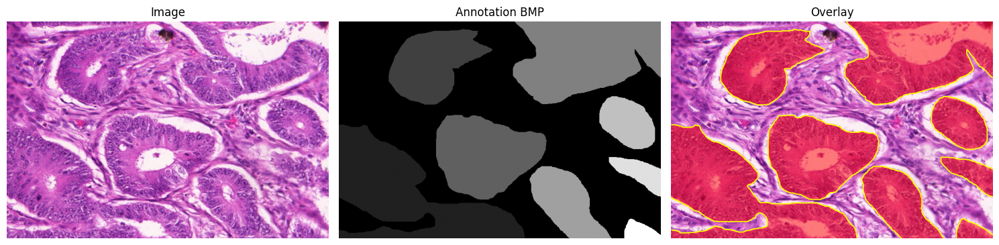

In [ ]:
# 把掩码标注叠加到图像上显示
import os
from pathlib import Path
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def load_img(path):
    return np.array(Image.open(path).convert("RGB"))

def load_mask_bmp(path):
    """
    适配常见 bmp 标注：
    - 如果是灰度/索引图：直接取单通道
    - 如果是 RGB：取任意一个通道（通常三通道相同）
    """
    m = Image.open(path)
    m_np = np.array(m)
    if m_np.ndim == 3:
        # RGB 标注常见三通道相同，这里取 R
        m_np = m_np[..., 0]
    return m_np

def overlay_mask(image_rgb, mask, alpha=0.45, color=(255, 0, 0), mask_is_binary=False):
    """
    image_rgb: HxWx3 uint8
    mask: HxW (uint8/int)
    alpha: 叠加透明度
    color: mask 区域颜色
    mask_is_binary: 如果你确定 mask 只有 0/255 或 0/1，可以设 True
    """
    img = image_rgb.astype(np.float32)

    if not mask_is_binary:
        # 通用：把非零当作前景（实例/语义都适用）
        fg = mask > 0
    else:
        fg = mask.astype(bool)

    overlay = img.copy()
    overlay[fg] = (1 - alpha) * overlay[fg] + alpha * np.array(color, dtype=np.float32)

    return overlay.astype(np.uint8)

def draw_contours(ax, mask, color="lime", linewidth=1.5):
    """
    用 matplotlib 的 contour 画边界（不需要 opencv）
    """
    fg = (mask > 0).astype(np.uint8)
    ax.contour(fg, levels=[0.5], colors=[color], linewidths=linewidth)

def show_overlay(image_path, anno_path, alpha=0.45, fill_color=(255,0,0), show_contour=True):
    img = load_img(image_path)
    mask = load_mask_bmp(anno_path)

    over = overlay_mask(img, mask, alpha=alpha, color=fill_color)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(img);  axes[0].set_title("Image"); axes[0].axis("off")
    axes[1].imshow(mask, cmap="gray"); axes[1].set_title("Annotation BMP"); axes[1].axis("off")
    axes[2].imshow(over); axes[2].set_title("Overlay"); axes[2].axis("off")
    if show_contour:
        draw_contours(axes[2], mask, color="yellow", linewidth=1.2)

    plt.tight_layout()
    plt.show()

# ====== 用法示例 ======
# 改成你自己的路径
IMG_PATH  = "/home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_13.bmp"
ANNO_PATH = "/home/path_sam3/pipeline/datasets/Glas_new/test/annos/testB_13_anno.bmp"

show_overlay(IMG_PATH, ANNO_PATH, alpha=0.5, fill_color=(255, 0, 0), show_contour=True)


[4/19] /home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_13.bmp
Size (W,H): (775, 522)


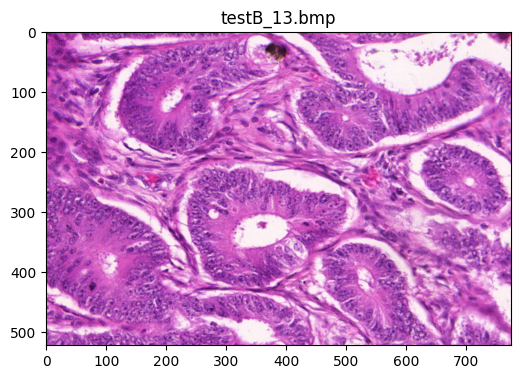

In [ ]:
# 显示目标图片

idx = 4  # <-- change me
idx = max(0, min(idx, len(images)-1))

p = images[idx]
img = Image.open(p).convert("RGB")

print(f"[{idx}/{len(images)-1}] {p}")
print("Size (W,H):", img.size)

plt.figure(figsize=(6,6))
plt.imshow(img)
plt.axis("on")
plt.title(p.name)
plt.show()

Normalized box input: [0.4903225898742676, 0.6226053833961487, 0.41290321946144104, 0.40229883790016174]


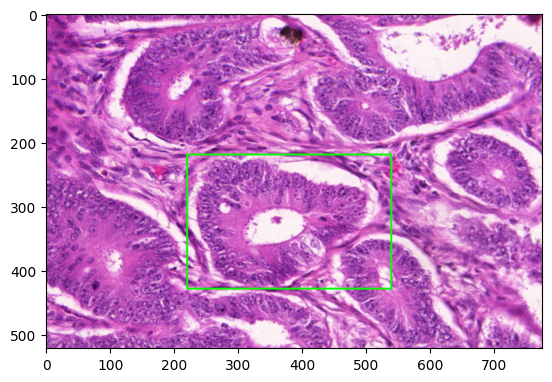

In [8]:
# 选择边框并添加到推理状态中，边框格式为 (x_min,y_min,w,h)


bbox = torch.tensor([220.0, 220.0, 320.0, 210.0]).view(-1, 4)  # example box in (x_min, y_min, w, h) format
width, height = img.size

# Here the box is in  (x,y,w,h) format, where (x,y) is the top left corner.

box_input_cxcywh = box_xywh_to_cxcywh(bbox)

norm_box_cxcywh = normalize_bbox(box_input_cxcywh, width, height).flatten().tolist()
print("Normalized box input:", norm_box_cxcywh)

processor.reset_all_prompts(inference_state)
inference_state = processor.add_geometric_prompt(
    state=inference_state, box=norm_box_cxcywh, label=True
)

img0 = Image.open(IMG_PATH)
image_with_box = draw_box_on_image(img0, bbox.flatten().tolist())
plt.imshow(image_with_box)
plt.axis("on") 
plt.show()

In [ ]:
# 打印模型inference state输出结构

for k, v in inference_state.items():
    # 如果值有shape属性（是Tensor/Array），打印shape
    if hasattr(v, 'shape'):
        print(f"{k}: {v.shape}")
    # 否则打印类型
    else:
        print(f"{k}: {type(v)}")

original_height: <class 'int'>
original_width: <class 'int'>
backbone_out: <class 'dict'>
geometric_prompt: <class 'sam3.model.geometry_encoders.Prompt'>
masks_logits: torch.Size([4, 1, 500, 750])
masks: torch.Size([4, 1, 500, 750])
boxes: torch.Size([4, 4])
scores: torch.Size([4])


found 8 object(s)


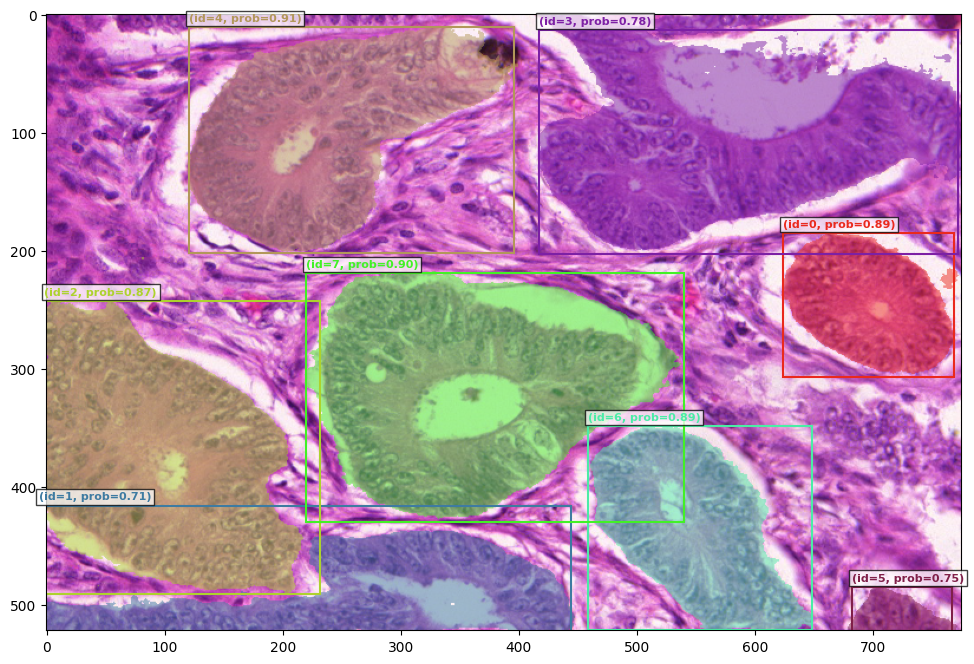

In [ ]:
# 利用官方的可视化函数显示结果

plot_results(img0, inference_state)

### 更多例子

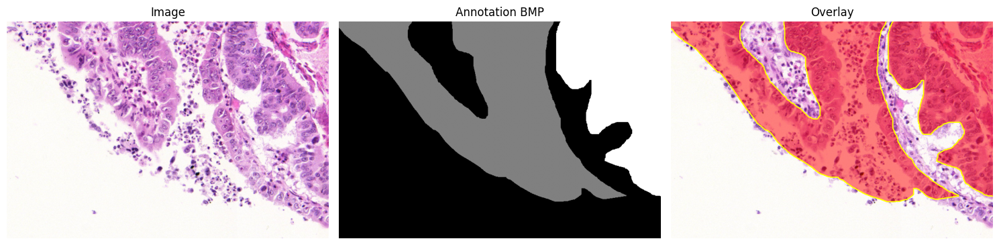

In [10]:
IMG_PATH  = "/home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_14.bmp"
ANNO_PATH = "/home/path_sam3/pipeline/datasets/Glas_new/test/annos/testB_14_anno.bmp"

show_overlay(IMG_PATH, ANNO_PATH, alpha=0.5, fill_color=(255, 0, 0), show_contour=True)

[5/19] /home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_14.bmp
Size (W,H): (775, 522)


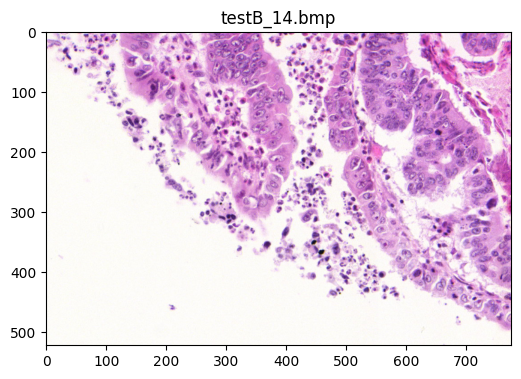

In [39]:
idx = 5  # <-- change me
idx = max(0, min(idx, len(images)-1))

p = images[idx]
img2 = Image.open(p).convert("RGB")

print(f"[{idx}/{len(images)-1}] {p}")
print("Size (W,H):", img2.size)

plt.figure(figsize=(6,6))
plt.imshow(img2)
plt.axis("on")
plt.title(p.name)
plt.show()

Normalized box input: [0.8348386883735657, 0.43103447556495667, 0.32774192094802856, 0.8620689511299133]


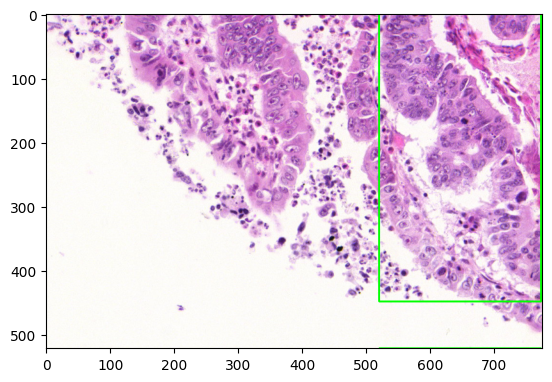

In [40]:
#bbox = [520, 0, 255, 430]
processor = Sam3Processor(model, confidence_threshold=0.7)
inference_state = processor.set_image(img2)
bbox = torch.tensor([520, 0, 254, 450]).view(-1, 4)  # example box in (x_min, y_min, x_max, y_max) format
width, height = img.size

# Here the box is in  (x,y,w,h) format, where (x,y) is the top left corner.

box_input_cxcywh = box_xywh_to_cxcywh(bbox)

norm_box_cxcywh = normalize_bbox(box_input_cxcywh, width, height).flatten().tolist()
print("Normalized box input:", norm_box_cxcywh)

processor.reset_all_prompts(inference_state)
inference_state = processor.add_geometric_prompt(
    state=inference_state, box=norm_box_cxcywh, label=True
)

img2 = Image.open(IMG_PATH)
image_with_box = draw_box_on_image(img2, bbox.flatten().tolist())
plt.imshow(image_with_box)
plt.axis("on") 
plt.show()


found 2 object(s)


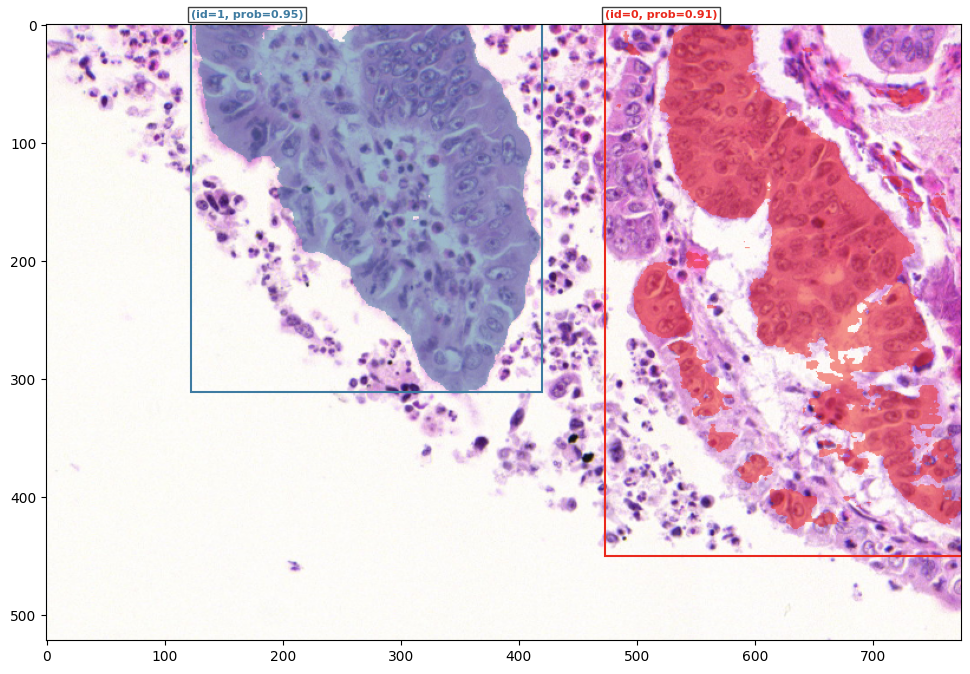

In [41]:
plot_results(img2, inference_state)

### 测试裁剪不同大小模型是否适配

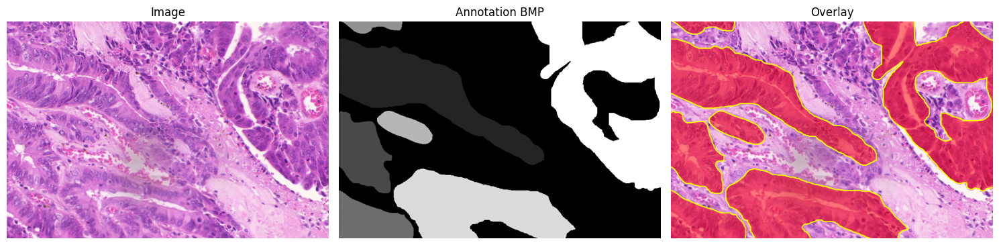

In [42]:
IMG_PATH  = "/home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_15.bmp"
ANNO_PATH = "/home/path_sam3/pipeline/datasets/Glas_new/test/annos/testB_15_anno.bmp"

show_overlay(IMG_PATH, ANNO_PATH, alpha=0.5, fill_color=(255, 0, 0), show_contour=True)

[6/19] /home/path_sam3/pipeline/datasets/Glas_new/test/images/testB_15.bmp
Size (W,H): (775, 522)


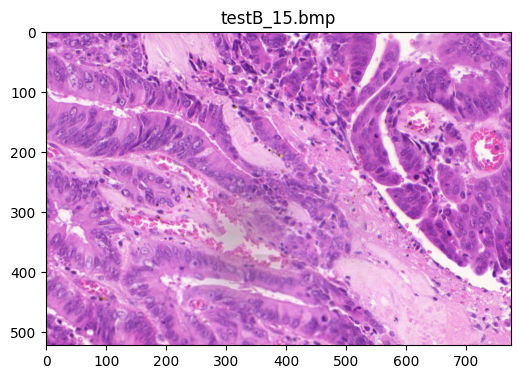

In [14]:
idx = 6  # <-- change me
idx = max(0, min(idx, len(images)-1))

p = images[idx]
img3 = Image.open(p).convert("RGB")

print(f"[{idx}/{len(images)-1}] {p}")
print("Size (W,H):", img3.size)

plt.figure(figsize=(6,6))
plt.imshow(img3)
plt.axis("on")
plt.title(p.name)
plt.show()

Cropped size: (750, 500)


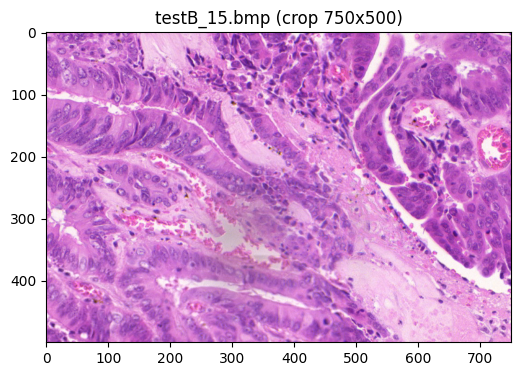

In [15]:
target_w, target_h = 750, 500

w, h = img3.size  # (W, H)
left   = (w - target_w) // 2
top    = (h - target_h) // 2
right  = left + target_w
bottom = top + target_h

img3_crop = img3.crop((left, top, right, bottom))

print("Cropped size:", img3_crop.size)

plt.figure(figsize=(6,6))
plt.imshow(img3_crop)
plt.axis("on")
plt.title(p.name + " (crop 750x500)")
plt.show()


Normalized box input: [0.32258063554763794, 0.3639846742153168, 0.6451612710952759, 0.5747126340866089]


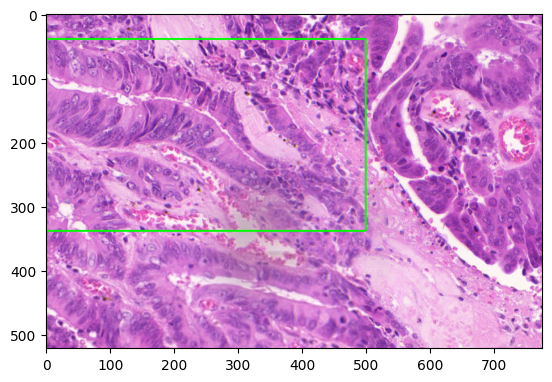

In [46]:
#bbox = [520, 0, 255, 430]
processor = Sam3Processor(model, confidence_threshold=0.5)
inference_state = processor.set_image(img3)
bbox = torch.tensor([0, 40, 500, 300]).view(-1, 4)  # example box in (x_min, y_min, x_max, y_max) format
width, height = img.size

# Here the box is in  (x,y,w,h) format, where (x,y) is the top left corner.

box_input_cxcywh = box_xywh_to_cxcywh(bbox)

norm_box_cxcywh = normalize_bbox(box_input_cxcywh, width, height).flatten().tolist()
print("Normalized box input:", norm_box_cxcywh)

processor.reset_all_prompts(inference_state)
inference_state = processor.add_geometric_prompt(
    state=inference_state, box=norm_box_cxcywh, label=True
)

img2 = Image.open(IMG_PATH)
image_with_box = draw_box_on_image(img3, bbox.flatten().tolist())
plt.imshow(image_with_box)
plt.axis("on") 
plt.show()

found 5 object(s)


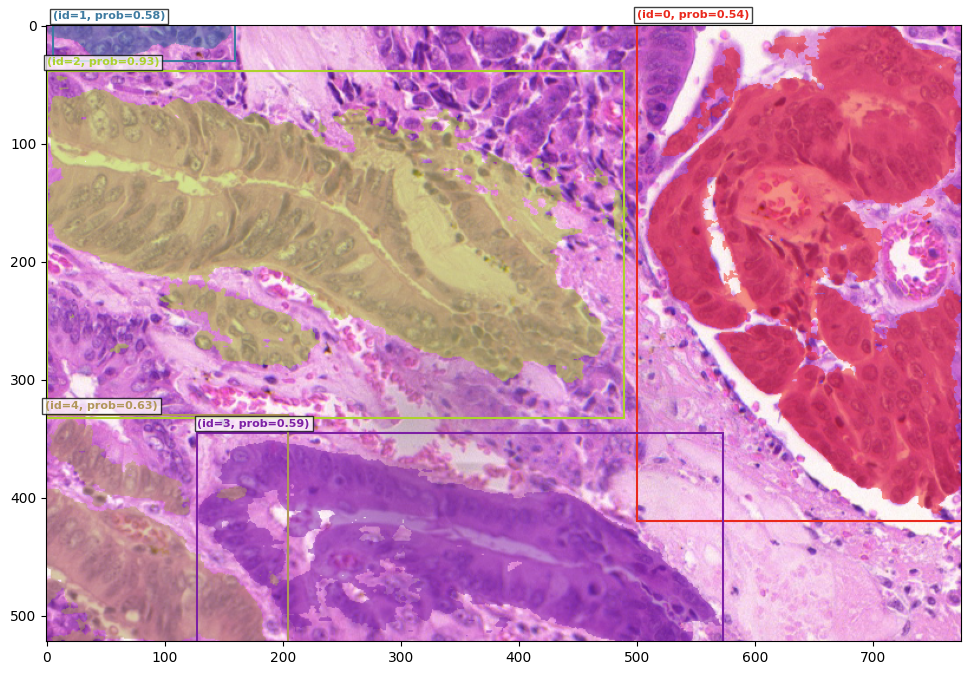

In [47]:
plot_results(img3, inference_state)

Normalized box input: [0.3333333432674408, 0.3799999952316284, 0.6666666865348816, 0.6000000238418579]


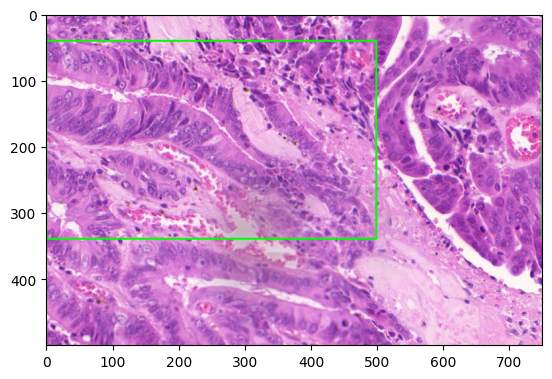

In [16]:
#bbox = [520, 0, 255, 430]
processor = Sam3Processor(model, confidence_threshold=0.5)
inference_state = processor.set_image(img3_crop)
bbox = torch.tensor([0, 40, 500, 300]).view(-1, 4)  # example box in (x_min, y_min, x_max, y_max) format
width, height = img3_crop.size

# Here the box is in  (x,y,w,h) format, where (x,y) is the top left corner.

box_input_cxcywh = box_xywh_to_cxcywh(bbox)

norm_box_cxcywh = normalize_bbox(box_input_cxcywh, width, height).flatten().tolist()
print("Normalized box input:", norm_box_cxcywh)

processor.reset_all_prompts(inference_state)
inference_state = processor.add_geometric_prompt(
    state=inference_state, box=norm_box_cxcywh, label=True
)

#img2 = Image.open(IMG_PATH)
image_with_box = draw_box_on_image(img3_crop, bbox.flatten().tolist())
plt.imshow(image_with_box)
plt.axis("on") 
plt.show()

found 4 object(s)


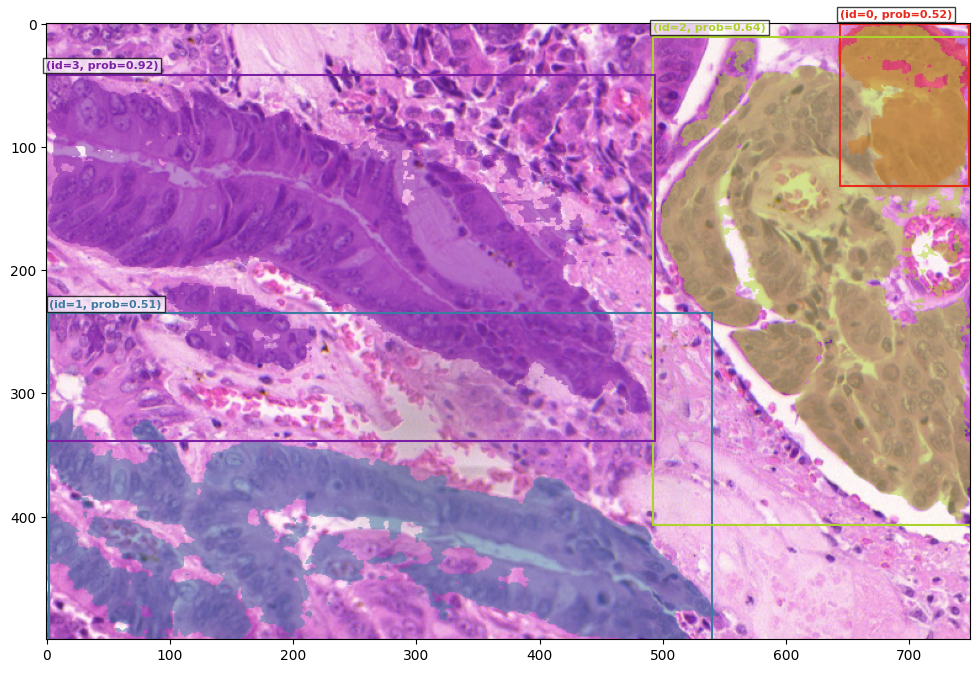

In [17]:
plot_results(img3_crop, inference_state)